In [1]:
from sklearn.manifold import Isomap, LocallyLinearEmbedding, MDS, SpectralEmbedding, TSNE
from sklearn.decomposition import PCA
import umap.umap_ as umap
import numpy as np
import wandb
from sklearn.preprocessing import LabelEncoder
from io import BytesIO
import base64
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.io import output_notebook
from bokeh.resources import INLINE
import colorcet as cc
import pandas as pd
from gorillatracker.datasets.cxl import CXLDataset
from gorillatracker.model import EfficientNetV2Wrapper
from gorillatracker.transform_utils import SquarePad
import torch
import torchvision.transforms as transforms

output_notebook(INLINE)


class EmbeddingProjector:
    def __init__(self):
        self.algorithms = {
            "tsne": TSNE(n_components=2),
            "isomap": Isomap(n_components=2),
            "lle": LocallyLinearEmbedding(n_components=2),
            "mds": MDS(n_components=2),
            "spectral": SpectralEmbedding(n_components=2),
            "pca": PCA(n_components=2),
            "umap": umap.UMAP(),
        }

    def reduce_dimensions(self, embeddings, method="tsne"):
        # handle --fast_dev_run where there is a reduced number of embeddings
        assert len(embeddings) > 2
        algorithm = TSNE(n_components=2, perplexity=1)
        if len(embeddings) > 30:
            algorithm = self.algorithms.get(method, TSNE(n_components=2))
        return algorithm.fit_transform(embeddings)

    def plot_clusters(
        self, low_dim_embeddings, labels, og_labels, images, title="Embedding Projector", figsize=(12, 10)
    ):
        color_names = cc.glasbey
        color_lst = [color_names[label * 2] for label in labels]
        data = {
            "x": low_dim_embeddings[:, 0],
            "y": low_dim_embeddings[:, 1],
            "color": color_lst,
            "class": og_labels,
            "image": images,
        }

        fig = figure(tools="pan, wheel_zoom, box_zoom, reset")
        fig.scatter(
            x="x",
            y="y",
            size=12,
            fill_color="color",
            line_color="black",
            source=ColumnDataSource(data=data),
            legend_field="class",
        )

        hover = HoverTool(tooltips='<img src="data:image/jpeg;base64,@image" width="128" height="128">')
        fig.add_tools(hover)

        output_notebook()
        show(fig)

/tmp/ipykernel_58295/1821441933.py:14: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was too old on your system - pyarrow 10.0.1 is the current minimum supported version as of this release.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


Loading BokehJS ...

### Generate Embeddings by loading a model an running it on a val dataset

In [2]:
wandb.login()
wandb.init(mode="disabled")
api = wandb.Api()

artifact = api.artifact(
    "gorillas/Embedding-ALL-SPAC-Open/model-3ag1c2vf:v1",  # your artifact name
    type="model",
)
artifact_dir = artifact.download()
model = artifact_dir + "/model.ckpt"

# load model
checkpoint = torch.load(model, map_location=torch.device("cpu"))

model = EfficientNetV2Wrapper(  # switch this with the model you want to use
    model_name_or_path="EfficientNetV2_Large",
    from_scratch=False,
    loss_mode="softmax/arcface",
    weight_decay=0.001,
    lr_schedule="cosine",
    warmup_mode="cosine",
    warmup_epochs=10,
    max_epochs=100,
    initial_lr=0.01,
    start_lr=0.01,
    end_lr=0.0001,
    beta1=0.9,
    beta2=0.999,
    embedding_size=128,
)
# the following lines are necessary to load a model that was trained with arcface (the prototypes are saved in the state dict)
model.loss_module_train.prototypes = torch.nn.Parameter(checkpoint["state_dict"]["loss_module_train.prototypes"])
model.loss_module_val.prototypes = torch.nn.Parameter(checkpoint["state_dict"]["loss_module_val.prototypes"])

model.load_state_dict(checkpoint["state_dict"])
model.eval()

# generate table that contains labels and images and embeddings
df = pd.DataFrame(columns=["label", "image", "embedding"])
dataset = CXLDataset(
    data_dir="/workspaces/gorillatracker/data/splits/ground_truth-cxl-face_images-openset-reid-val-0-test-0-mintraincount-3-seed-42-train-50-val-25-test-25",
    partition="val",
    transform=transforms.Compose(  # use the transforms that were used for the model (except of course data augmentations)
        [
            SquarePad(),
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
        ]
    ),
)

for i in range(len(dataset)):
    image_tensor, label = dataset[i]
    label_string = dataset.mapping[label]
    image = transforms.ToPILImage()(image_tensor)
    image_tensor = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.228, 0.224, 0.225])(
        image_tensor
    )  # if your model was trained with normalization, you need to normalize the images here as well
    embedding = model(image_tensor.unsqueeze(0))
    df = pd.concat(
        [
            df,
            pd.DataFrame(
                {
                    "label_string": [label_string],
                    "label": [label],
                    "image": [image],
                    "embedding": [embedding[0].detach().numpy()],
                }
            ),
        ]
    )

    if i % 10 == 0:
        print(f"\rprocessed {i} images")
df = df.reset_index(drop=False)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: Downloading large artifact model-3ag1c2vf:v1, 1346.85MB. 1 files... 
wandb:   1 of 1 files downloaded.  
Done. 0:0:2.0


processed 0 images
processed 10 images
processed 20 images
processed 30 images
processed 40 images
processed 50 images
processed 60 images
processed 70 images
processed 80 images
processed 90 images
processed 100 images
processed 110 images
processed 120 images


In [3]:
labels = df["label"].to_numpy()
embeddings = df["embedding"].to_numpy()
embeddings = np.stack(embeddings)

pil_images = df["image"]
images = []
for image in pil_images:
    buffer = BytesIO()
    image.save(buffer, format="JPEG")
    image_byte = base64.b64encode(buffer.getvalue()).decode("utf-8")
    images.append(image_byte)

ep = EmbeddingProjector()
low_dim_embeddings = ep.reduce_dimensions(embeddings, method="umap")
ep.plot_clusters(low_dim_embeddings, labels, df["label_string"], images, title="Embedding Projector", figsize=(12, 10))

Loading BokehJS ...

### Maybe a better overview of the data when len(individual) > 3

In [4]:
# filter out classes that have less than 3 images
df_filtered = df.groupby("label").filter(lambda x: len(x) > 3)

labels_filtered = df_filtered["label"].to_numpy()
embeddings_filtered = df_filtered["embedding"].to_numpy()
embeddings_filtered = np.stack(embeddings_filtered)

pil_images_filtered = df_filtered["image"]
images = []
for image in pil_images_filtered:
    buffer = BytesIO()
    image.save(buffer, format="JPEG")
    image_byte = base64.b64encode(buffer.getvalue()).decode("utf-8")
    images.append(image_byte)

ep = EmbeddingProjector()
low_dim_embeddings = ep.reduce_dimensions(embeddings_filtered, method="tsne")
ep.plot_clusters(
    low_dim_embeddings,
    labels_filtered,
    df_filtered["label_string"],
    images,
    title="Embedding Projector",
    figsize=(12, 10),
)

Loading BokehJS ...

### Now add Grad-CAM

In [5]:
import torchmetrics as tm


# calculate weights by averaging embeddings of each class (if no arcface was used then donot use this function)
def get_weights(embeddings, labels):
    embeddings = torch.tensor(embeddings)
    num_classes = 29  # NOTE: this is hardcoded for now
    weights = torch.zeros((num_classes, 128))
    for i in range(num_classes):
        weights[i] = torch.mean(embeddings[labels == i], dim=0)
    weights = torch.nn.functional.normalize(weights, dim=1)
    return weights


def fc_layer2(
    embeddings,
    labels,
    s=64.0,
    **kwargs,
):
    num_classes = 29  # NOTE: this is hardcoded for now

    embeddings = torch.tensor(embeddings)
    labels = torch.tensor(labels)

    # calculate weights by averaging embeddings of each class
    weights = get_weights(embeddings, labels)

    weights = torch.nn.functional.normalize(weights, dim=1)
    embeddings = torch.nn.functional.normalize(embeddings, dim=1)
    output = torch.nn.functional.linear(embeddings, weights)
    output = output * s
    final_output = torch.nn.functional.softmax(output, dim=1)

    preds = torch.max(final_output, dim=1)[1]

    accuracy = tm.functional.accuracy(
        final_output, labels, task="multiclass", num_classes=num_classes, average="weighted"
    )
    assert accuracy is not None
    accuracy_top5 = tm.functional.accuracy(final_output, labels, task="multiclass", num_classes=num_classes, top_k=5)
    assert accuracy_top5 is not None
    auroc = tm.functional.auroc(final_output, labels, task="multiclass", num_classes=num_classes)
    assert auroc is not None
    f1 = tm.functional.f1_score(final_output, labels, task="multiclass", num_classes=num_classes, average="weighted")
    assert f1 is not None
    return (
        {
            "accuracy": accuracy.item(),
            "accuracy_top5": accuracy_top5.item(),
            "auroc": auroc.item(),
            "f1": f1.item(),
        },
        weights,
        preds,
        labels,
    )


labels = df["label"].to_numpy().astype(int)
results, weights, preds, labels = fc_layer2(embeddings, labels)


false_predictions_indices = np.where(preds != labels)[0]
false_predictions = df.iloc[false_predictions_indices]

print(results)

/tmp/ipykernel_55705/3651930818.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  embeddings = torch.tensor(embeddings)


TypeError: only integer tensors of a single element can be converted to an index

### Get some insights into the weights (can be skipped)

In [ ]:
import seaborn as sns

weights_np = weights.detach().numpy()
weights_df = pd.DataFrame(weights_np)
print(weights_df.head())

sns.set_theme(style="white")
ax = sns.boxplot(data=weights_df.to_numpy(), orient="h", palette="Set2")
ax.set_title("Distribution of weights in the final layer")

weights_df.describe()

### Apply on Grad-Cam with correctly weighted embeddings

In [8]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import PIL


def get_grad_cam_layer():
    return model.model.features[-1][-1]


def log_grad_cam_images_to_wandb(model, samples, transform=lambda x: x) -> None:  # TODO
    # NOTE(liamvdv): inverse grad cam support to model since we might not be using
    #                a model which grad cam does not support.
    # NOTE(liamvdv): Transform models may have different interpretations.
    # print(samples)
    assert model is not None, "Must only call log_grad_cam_images... after model was initialized."

    target_layer = get_grad_cam_layer()
    get_reshape_transform = getattr(model, "get_grad_cam_reshape_transform", lambda: None)
    cam = GradCAM(model=model, target_layers=[target_layer], reshape_transform=get_reshape_transform())

    images_pred = []
    images_target = []
    for sample in samples:
        # a row (nlet) can either be (ap, p, n) OR (ap, p, n, an)
        img, label = sample
        img_to_fit = transform(img)
        grayscale_cam = cam(input_tensor=img_to_fit.unsqueeze(0), targets=label, aug_smooth=False, eigen_smooth=True)
        #
        # Overlay heatmap on original image
        heatmap = grayscale_cam[0, :]
        image = np.array(transforms.ToPILImage()(img)).astype(np.float32) / 255.0  # NOTE(liamvdv): needs be normalized
        image_with_heatmap = show_cam_on_image(image, heatmap, use_rgb=True)
        images_pred.append(PIL.Image.fromarray(image_with_heatmap))
    return images_pred


# NOTE: this is a custom output target that is necessary to use gradcam with arcface if no arcface was used then you can use no target as well
class CustomOutputTarget:
    def __init__(self, category):
        self.category = category
        self.weights = get_weights(embeddings, labels)

    def __call__(self, x):
        if len(x.shape) == 1:
            x = x.unsqueeze(0)

        x = torch.nn.functional.normalize(x, dim=1)
        output = torch.nn.functional.linear(x, weights)
        output = output * 64.0
        x = torch.nn.functional.softmax(output, dim=1)
        return x[:, self.category]


amount = 10
imgs = []
for index in range(amount):
    sample_imgs = transforms.ToTensor()(df["image"][index])
    sample_labels = torch.tensor([df["label"][index]])

    # one hot encode labels
    sample_labels = [CustomOutputTarget(sample_labels[0])]

    samples = [(sample_imgs, sample_labels)]
    imgs.append(
        log_grad_cam_images_to_wandb(
            model,
            samples,
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.228, 0.224, 0.225]),
        )
    )

imgs = [img for sublist in imgs for img in sublist]

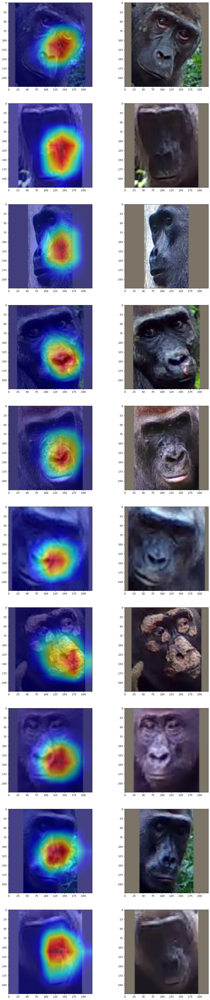

In [9]:
# convert to pil images and show with matplotlib
import matplotlib.pyplot as plt

fig, axs = plt.subplots(amount, 2, figsize=(15, 7 * amount))

for index in range(amount):
    axs[index, 0].imshow(imgs[index])
    axs[index, 1].imshow(df["image"][index])

plt.show()

In [ ]:
# now show the images that were wrongly classified
amount = len(false_predictions_indices)
print(amount)
imgs = []
for index in false_predictions_indices[:amount]:
    sample_imgs = transforms.ToTensor()(df["image"][index])
    sample_labels = torch.tensor([df["label"][index]])

    # one hot encode labels
    sample_labels = [CustomOutputTarget(sample_labels[0])]

    samples = [(sample_imgs, sample_labels)]
    imgs.append(
        log_grad_cam_images_to_wandb(
            model,
            samples,
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.228, 0.224, 0.225]),
        )
    )

imgs = [img for sublist in imgs for img in sublist]

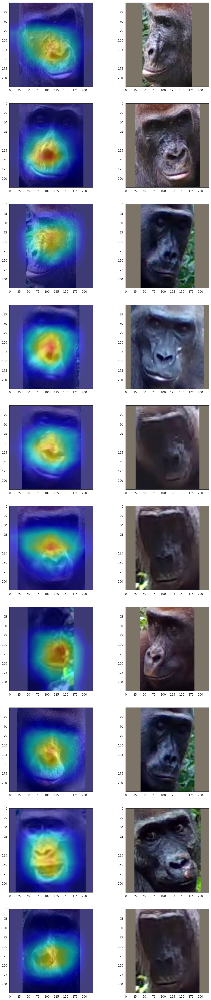

In [57]:
# convert to pil images and show with matplotlib
import matplotlib.pyplot as plt

fig, axs = plt.subplots(amount, 2, figsize=(15, 7 * amount))

for index in range(amount):
    axs[index, 0].imshow(imgs[index])
    # show image of individual it was wrongly classified as
    axs[index, 1].imshow(df["image"][preds[false_predictions_indices[index]].item()])

plt.show()